In [1]:
import sys

sys.path.append("..")

import pickle as pkl

import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from cbdetect_py import CornerType, Params, boards_from_corners, find_corners
from ipywidgets import FloatSlider, IntRangeSlider, interact
from pandas.compat import os
from PIL import Image, ImageOps
from tqdm.auto import tqdm
from tqdm.contrib.concurrent import process_map

from calibration.benchmark.benchmark import (
    BenchmarkResult,
    benchmark_babelcalib,
    benchmark_simul,
)
from calibration.benchmark.benchmark_result import calc_error
from calibration.data.babelcalib.babelcalib import load_babelcalib
from calibration.data.babelcalib.entry import Entry
from calibration.feature_detector.checkerboard import detect_corners
from calibration.feature_detector.visualization import show_boards, show_corners
from calibration.feature_refiner.refine import refine_features_single
from calibration.feature_refiner.visualization import show_refined_corners

%load_ext autoreload
%autoreload 2

In [9]:
with open("../refined_babelcalib_results_None.pkl", "rb") as f:
    results = pkl.load(f)

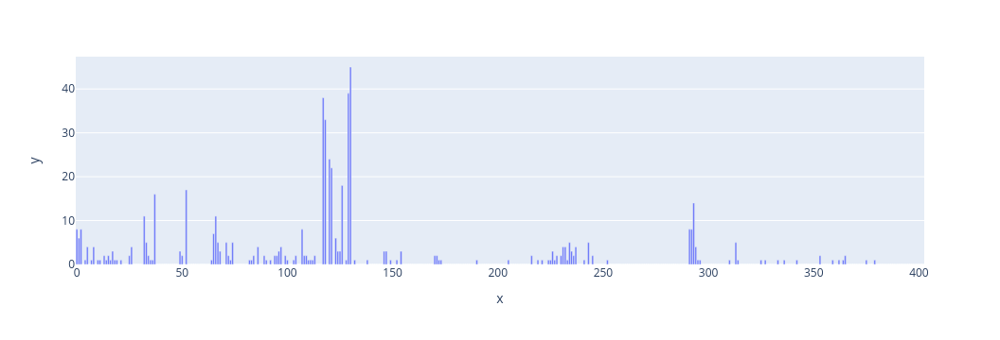

In [10]:
px.bar(y=[(r.new_board_mask == 2).sum() for r in results if r])

In [11]:
results_ = sorted([r for r in results if r is not None], key=lambda r: r.error)
results_ = sorted(
    [r for r in results if r is not None], key=lambda r: (r.new_board_mask == 2).sum()
)

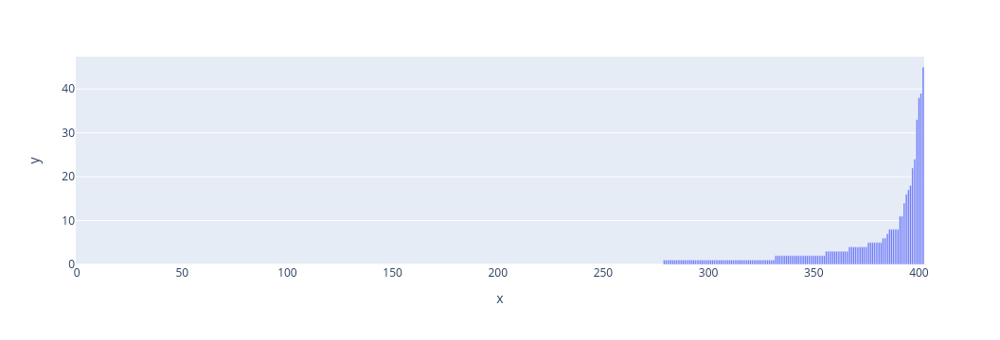

In [12]:
px.bar(y=[(r.new_board_mask == 2).sum() for r in results_])

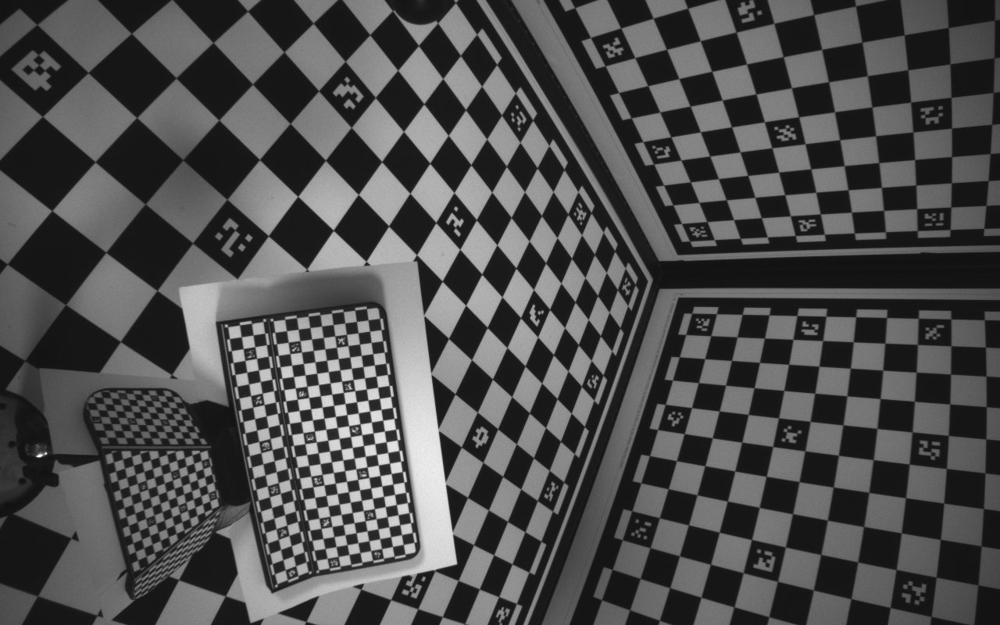

In [13]:
results_[-1].input.image

In [14]:
@interact
def f(i=(0, len(results_))):
    r = results_[i]
    w, h = r.input.image.size

    print(
        f"{i}, error_Optim={r.error}, n_new_corners = {(r.new_board_mask == 2).sum()}"
    )

    display(
        show_refined_corners(
            np.array(r.input.image),
            r.refined_features.corners,
            r.refined_features.board,
            r.new_board_mask,
            r.responses,
        ).update_layout(height=h, width=w, title="Refined")
    )
    display(
        show_boards(
            np.array(r.input.image),
            r.features.corners,
            r.features.board,
            # r.new_board_mask,
            # r.responses,
        ).update_layout(height=h, width=w, title="Refined")
    )

interactive(children=(IntSlider(value=201, description='i', max=403), Output()), _dom_classes=('widget-interac…

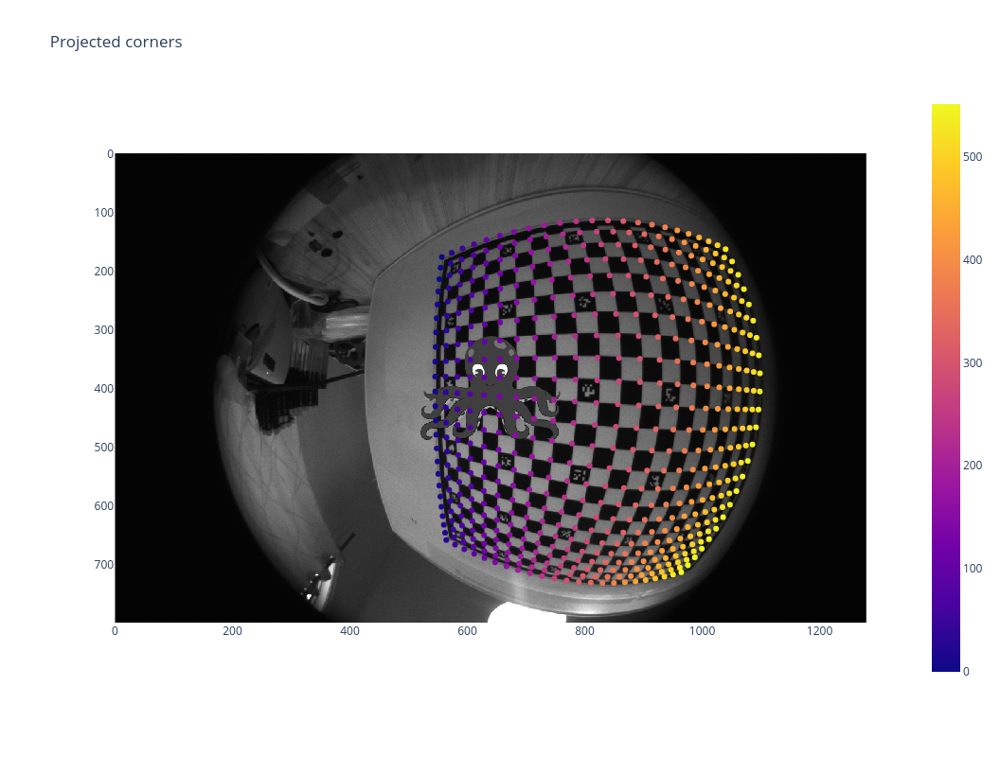

In [178]:
r = results_[96]

w, h = r.input.image.size
show_boards(
    np.array(r.input.image),
    r.refined_features.corners,
    r.refined_features.board,
).update_layout(height=h, width=w, title="Projected corners")

In [177]:
from calibration.augmentations.augmentations import overlay_img, remove_corners

[520 311]


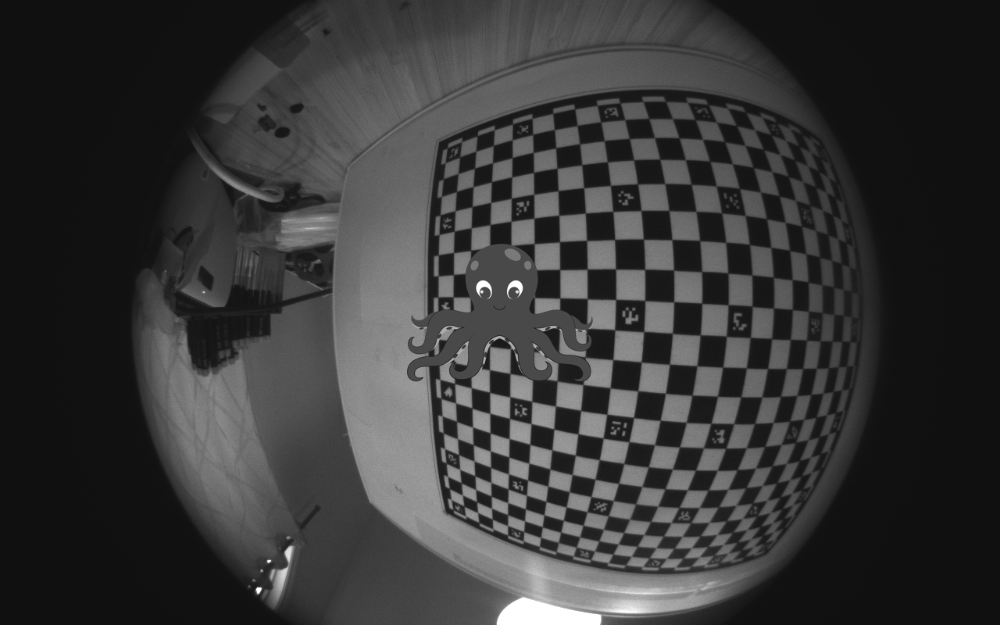

In [175]:
overlay_img(r.input.image, "../data/octopus.png")

In [193]:
from copy import deepcopy

r = deepcopy(results_[98])
r = remove_corners(r)

(237,) (237, 2)


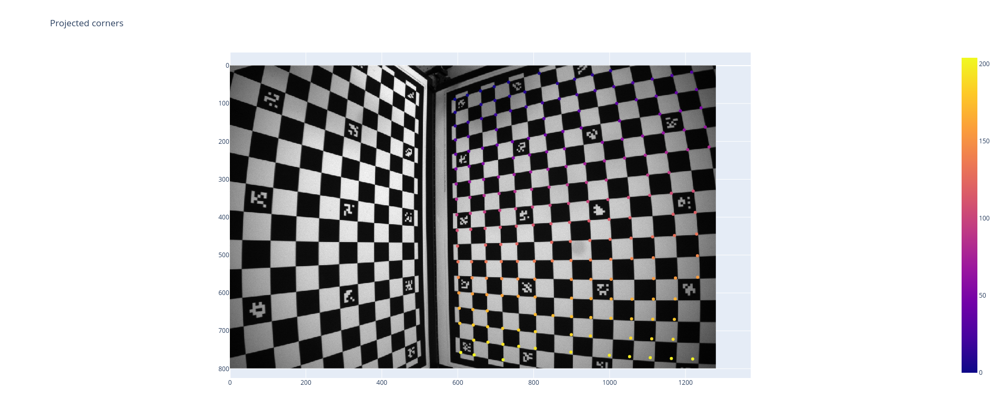

In [194]:
show_boards(
    np.array(r.input.image),
    r.prediction.project(r.features.board),
    r.features.board,
).update_layout(height=h, width=w, title="Projected corners")

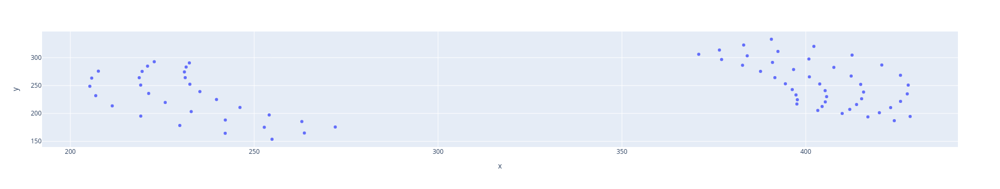

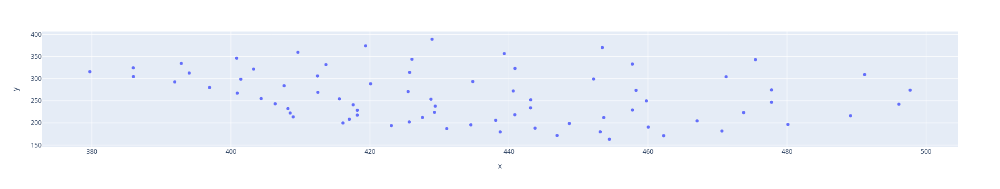

(76, 2)
(76, 2)
(117, 2)


IndexError: boolean index did not match indexed array along dimension 0; dimension is 76 but corresponding boolean dimension is 117

In [140]:
r_ = refine_features_single(BenchmarkResult(r.input, r.features, {"Optimization":r.prediction}))

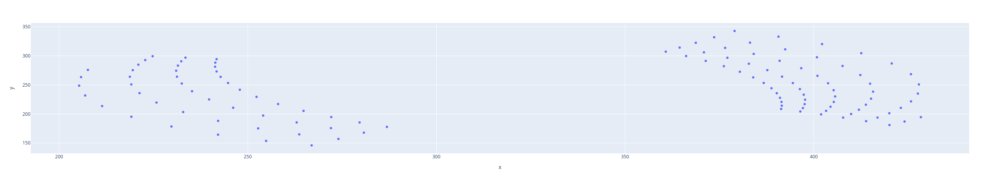

In [133]:
px.scatter(x=r.refined_features.corners[:, 0], y=r.refined_features.corners[:, 1], height=h, width=w)

In [66]:
from calibration.feature_refiner.classifier import compute_orientation

In [160]:
passes = compute_orientation(
    np.array(r.input.image), r.refined_features.corners.astype(int), 5
)

  0%|          | 0/552 [00:00<?, ?it/s]

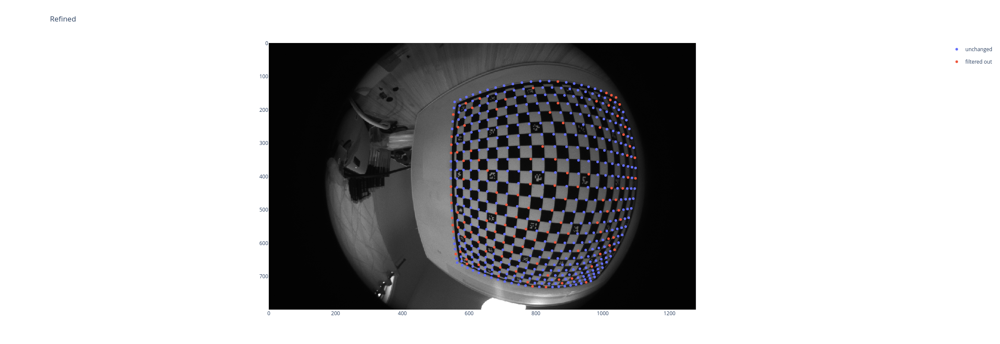

In [163]:
show_refined_corners(
    np.array(r.input.image),
    r.refined_features.corners,
    r.refined_features.board,
    np.array(passes).astype(int),
    r.responses,
).update_layout(height=h, width=w, title="Refined")

In [11]:
key = "OV/cube/ov00", "train", "ov00/0031.pgm"
r = next(
    r for r in results if (r.input.ds_name, r.input.subds_name, r.input.name) == key
)

{'Scaramuzza': 3.859001445360994, 'Optimization': 2.172066414282015}


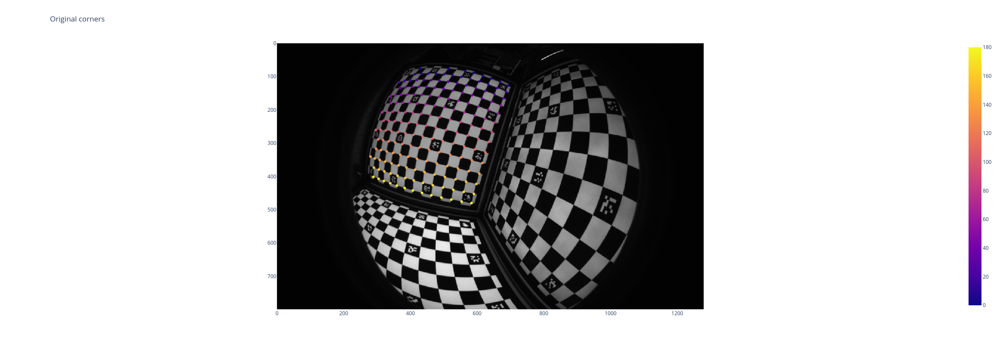

In [12]:
w, h = r.input.image.size

print(r.errors)
show_boards(r.input.image, r.features.corners, r.features.board).update_layout(
    height=h, width=w, title="Original corners"
)

In [38]:
ref_r = refine_features_single(r)

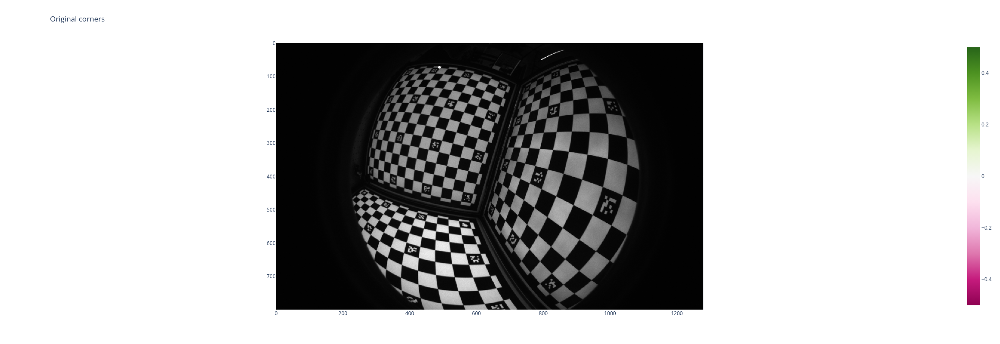

In [36]:
show_boards(
    ref_r.input.image,
    ref_r.refined_features.corners[ref_r.new_board_mask == 2],
    ref_r.refined_features.board[ref_r.new_board_mask == 2],
).update_layout(height=h, width=w, title="Refined corners")

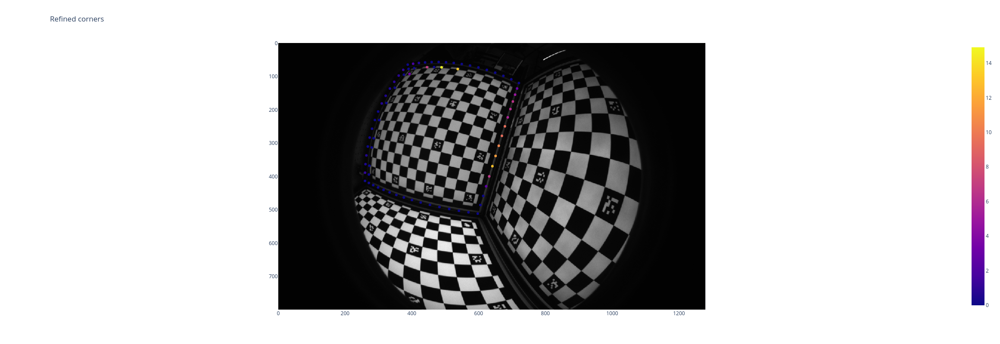

In [45]:
fig1 = px.imshow(ref_r.input.image, binary_string=True)

corners, board = (
    ref_r.refined_features.corners[ref_r.new_board_mask > 0],
    ref_r.refined_features.board[ref_r.new_board_mask > 0],
)
points = [
    {
        "n": i,
        "i": feature[0],
        "j": feature[1],
        "x": corner[0],
        "y": corner[1],
        "response": response,
    }
    for i, (corner, feature, response) in enumerate(
        zip(corners, board, ref_r.responses)
    )
]
df = pd.DataFrame(points)
fig2 = px.scatter(df, x="x", y="y", color="response", hover_data=["i", "j"])
go.Figure(data=[fig1.data[0], fig2.data[0]]).update_layout(
    height=h, width=w, title="Refined corners"
)